# University Fine Tuning

This notebook contains the functions used to fine tune the model to the Robomaster dataset containing mostly indoor images from the DTI Campus

In [1]:
import cv2
import os
from tqdm import tqdm
from helper_functions_nb import *
AUTOTUNE = tf.data.experimental.AUTOTUNE

We load Tr_1 from the data folder

In [2]:
images, masks = load_data("data/mixed")

dataset = tf_dataset(images, masks, batch = 32)

We load the fine tuning dataset Ft_1

In [3]:
img_ft, masks_ft = load_data("data/fine_tuning/university")
tf_ft = tf_dataset(img_ft, masks_ft, batch=32)

In [4]:
def multiply_mask(image, mask):
    mask = mask * 255
    return image, mask
 
tf_ft = tf_ft.map(multiply_mask)

(224, 224, 1)
1.0


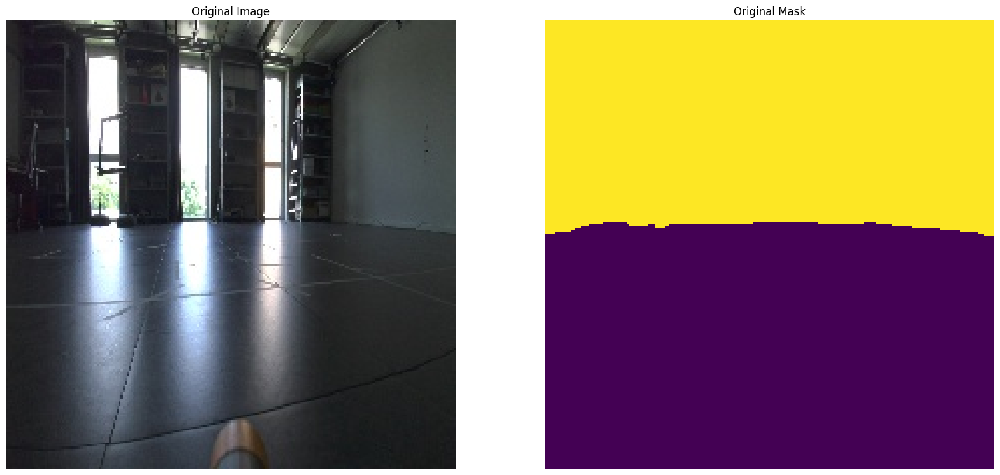

(224, 224, 1)
1.0


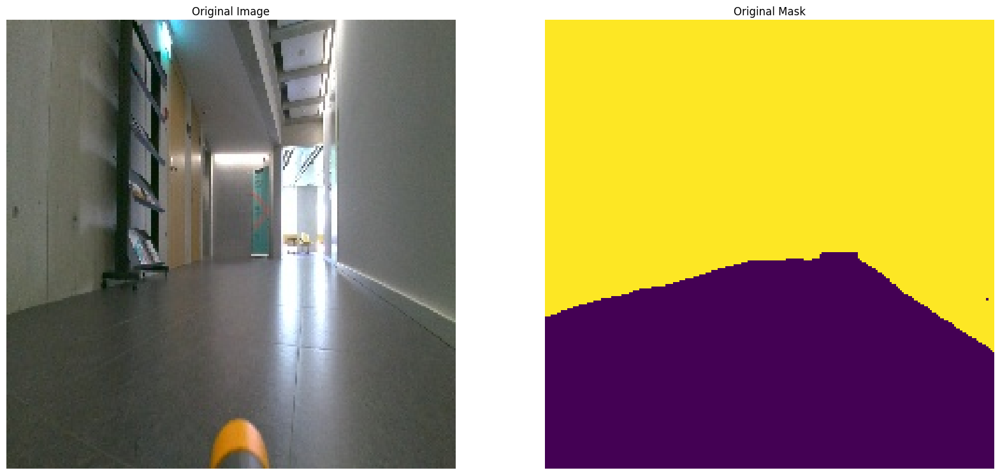

In [34]:
# visualize validation data
for img, mask in tf_ft.take(3):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(img[0])
    plt.title('Original Image')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(mask[0])
    print(mask[0].shape)
    plt.title('Original Mask')
    plt.axis('off')
    print(np.max(mask[0]))
    plt.show()

We run the augmentation on the Tr_1 Dataset

In [7]:
class CustomAugmentationLayer(tf.keras.layers.Layer):
    def __init__(self, seed=42, **kwargs):
        super(CustomAugmentationLayer, self).__init__(**kwargs)
        self.seed = seed
        self.augmentation_layers = tf.keras.Sequential([
            tf.keras.layers.experimental.preprocessing.RandomRotation(factor=0.02, fill_mode='nearest'),
            tf.keras.layers.experimental.preprocessing.RandomZoom(height_factor=(-0.3, 0.0), width_factor=(-0.3, 0.0), fill_mode='nearest'),
            tf.keras.layers.experimental.preprocessing.RandomFlip(mode="horizontal"),
        ])

    def call(self, inputs):
        image, mask = inputs
        image_and_mask = tf.concat([image, mask], axis=-1)  # Concatenate image and mask along the color dimension
        augmented_image_and_mask = self.augmentation_layers(image_and_mask, training=True)
        augmented_image, augmented_mask = tf.split(augmented_image_and_mask, num_or_size_splits=[3, 1], axis=-1)  # Split the augmented image and mask
        return augmented_image, augmented_mask


def augment(image, mask):
    
    augmentation_pipeline_only_images = tf.keras.Sequential([
        tf.keras.layers.RandomContrast(factor=0.8), # Randomly adjust contrast
        tf.keras.layers.RandomBrightness(factor=0.3, value_range=(0, 1)),  # Randomly adjust brightness
        ])
    
    custom_augment = CustomAugmentationLayer()
    
    image, mask = custom_augment((image, mask))
    
    image = augmentation_pipeline_only_images(image, training=True)
    
    
    return image, mask     

# Apply the custom augmentation layer to the dataset
augmented_dataset = dataset.map(lambda x, y: augment(x, y)).prefetch(AUTOTUNE)

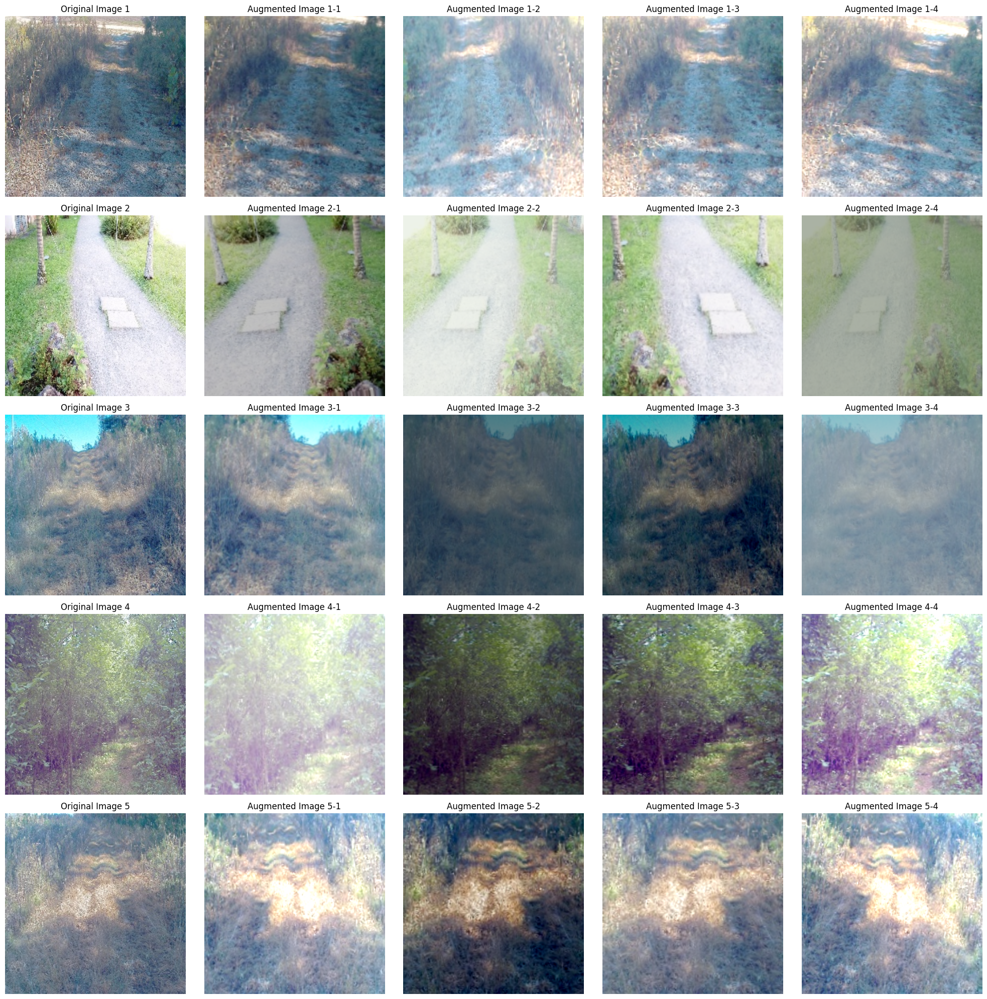

In [8]:
plt.figure(figsize=(20, 20))

# Iterate over multiple images and masks
for j, (x, y) in enumerate(dataset.take(5)):
    image = x[0]
    mask = y[0]

    # convert the image and mask to numpy arrays
    image = image.numpy()
    mask = mask.numpy()
    
    # convert mask to array of integer 0 and 1
    #mask = (mask > 0).astype(np.uint8).astype(np.float32)

    # convert the mask to a SegmentationMapsOnImage object

    # Display the original image and mask
    plt.subplot(5, 5, j*5 + 1)
    plt.imshow(image)
    plt.title('Original Image {}'.format(j+1))
    plt.axis('off')

    # Apply the augmentation pipeline to the image and mask multiple times and display the results
    for i in range(2, 6):
        augmented_image, augmented_segmap = augment(image, mask)
        plt.subplot(5, 5, j*5 + i)
        plt.imshow(augmented_image)
        #plt.imshow(augmented_segmap, alpha=0.5)
        plt.title('Augmented Image {}-{}'.format(j+1, i-1))
        plt.axis('off')

plt.tight_layout()
plt.show()

In [9]:
im_val, mask_val = load_data("data/validation", test=True)
dataset_val = tf_dataset(im_val, mask_val, batch = 1, shuffle=False)

In [10]:
dataset_val = dataset_val.map(multiply_mask)

## Model

we build and train the model on Tr_1

In [11]:
unet_aug = build_unet_model(8)

In [12]:
unet_aug.compile(optimizer="adam", loss="binary_crossentropy", metrics=tf.keras.metrics.AUC(name='auc'))

In [13]:
history = unet_aug.fit(augmented_dataset, validation_data=dataset_val, epochs=30)

Epoch 1/30
76/76 [==============================] - 24s 295ms/step - loss: 0.5992 - auc: 0.6280
Epoch 2/30
76/76 [==============================] - 24s 307ms/step - loss: 0.5554 - auc: 0.7294
Epoch 3/30
76/76 [==============================] - 24s 311ms/step - loss: 0.5335 - auc: 0.7540
Epoch 4/30
76/76 [==============================] - 24s 309ms/step - loss: 0.5259 - auc: 0.7610
Epoch 5/30
76/76 [==============================] - 24s 307ms/step - loss: 0.5208 - auc: 0.7636
Epoch 6/30
76/76 [==============================] - 24s 309ms/step - loss: 0.5063 - auc: 0.7787
Epoch 7/30
76/76 [==============================] - 24s 310ms/step - loss: 0.4775 - auc: 0.8121
Epoch 8/30
76/76 [==============================] - 23s 303ms/step - loss: 0.4774 - auc: 0.8108
Epoch 9/30
76/76 [==============================] - 23s 295ms/step - loss: 0.4626 - auc: 0.8245
Epoch 10/30
76/76 [==============================] - 23s 298ms/step - loss: 0.4385 - auc: 0.8424
Epoch 11/30
76/76 [====================

As a sanity check, we test it on the test dataset Te_1

In [16]:
test_images, test_masks = load_data("data/test", test=True)
test_dataset = tf_dataset(test_images, test_masks, batch=1, shuffle=False)

In [17]:
y_pred_aug = unet_aug.predict(test_dataset)

18/18 [==============================] - 0s 11ms/step


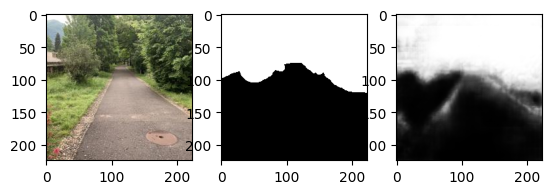

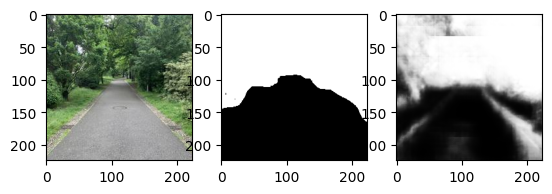

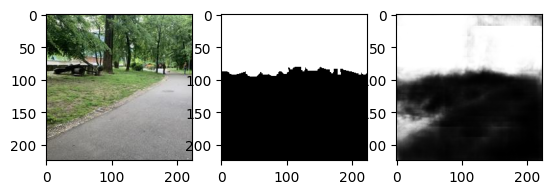

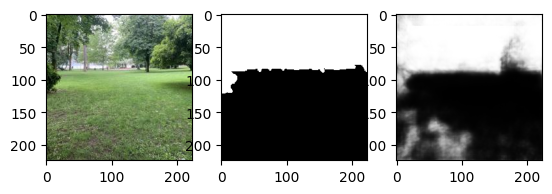

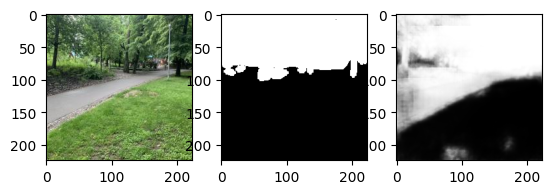

...

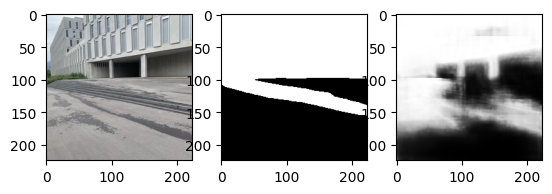

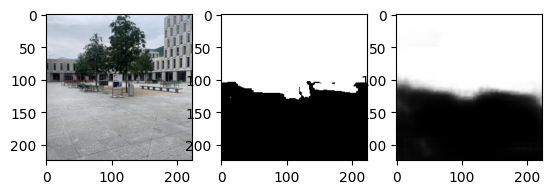

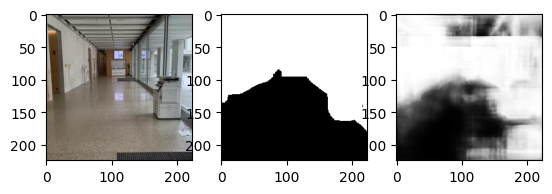

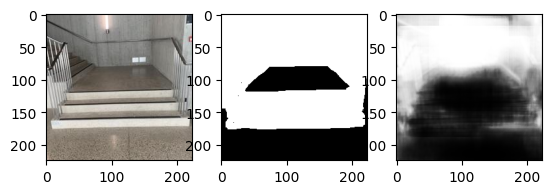

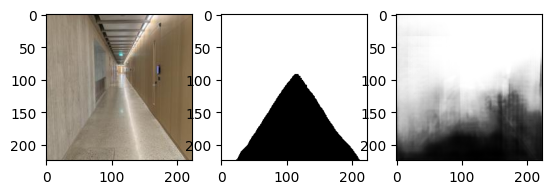

In [20]:
from matplotlib import pyplot as plt

for i in range(len(test_images)):
    fig, ax = plt.subplots(1, 3)
    ax[0].imshow(read_image(test_images[i]))
    ax[1].imshow(read_mask(test_masks[i]), cmap="gray")
    ax[2].imshow(y_pred_aug[i], cmap="gray")
    plt.show()

Then we calculate the AUC

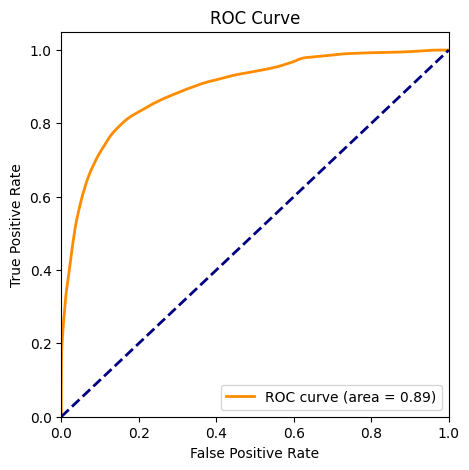

In [18]:
y_true = []
for image in os.listdir("data/test/masks"):
    img = cv2.imread(os.path.join("data/test/masks", image), cv2.IMREAD_GRAYSCALE)
    if np.max(img) > 1:
        img = img/np.max(img)
        img = img > 0.5
        img = img.astype(np.uint8)
    y_true.append(img)
    

y_true = np.array(y_true)
y_true_bin = y_true

# plot the roc curve
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(y_true_bin.flatten(), y_pred_aug.flatten())
roc_auc = auc(fpr, tpr)
 
plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('ROC Curve')
plt.legend(loc="lower right")
 
plt.show()

## Fine Tuning

Now we run the augmentation pipeline on the Ft_1 set

In [19]:
tf_ft_augmented = tf_ft.map(lambda x, y: augment(x, y)).prefetch(AUTOTUNE)

Then we retrain the model on the Ft_1 dataset, hence fine tuning our model

In [22]:
unet_aug.fit(tf_ft_augmented, epochs=10)

Epoch 1/10
2/2 [==============================] - 1s 252ms/step - loss: 0.1232 - auc: 0.9912
Epoch 2/10
2/2 [==============================] - 1s 256ms/step - loss: 0.1259 - auc: 0.9904
Epoch 3/10
2/2 [==============================] - 1s 221ms/step - loss: 0.1198 - auc: 0.9907
Epoch 4/10
2/2 [==============================] - 1s 252ms/step - loss: 0.1026 - auc: 0.9932
Epoch 5/10
2/2 [==============================] - 1s 227ms/step - loss: 0.1085 - auc: 0.9924
Epoch 6/10
2/2 [==============================] - 1s 216ms/step - loss: 0.1157 - auc: 0.9906
Epoch 7/10
2/2 [==============================] - 1s 223ms/step - loss: 0.1019 - auc: 0.9931
Epoch 8/10
2/2 [==============================] - 1s 222ms/step - loss: 0.1186 - auc: 0.9903
Epoch 9/10
2/2 [==============================] - 1s 257ms/step - loss: 0.1117 - auc: 0.9915
Epoch 10/10
2/2 [==============================] - 1s 222ms/step - loss: 0.0969 - auc: 0.9938


We retest the model on the Te_1 dataset to see if there was an improvement

In [32]:
y_pred_aug = unet_aug.predict(test_dataset)

18/18 [==============================] - 0s 16ms/step


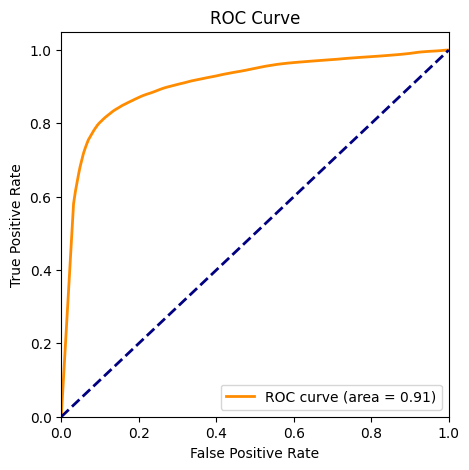

In [33]:
y_true = []
for image in os.listdir("data/test/masks"):
    img = cv2.imread(os.path.join("data/test/masks", image), cv2.IMREAD_GRAYSCALE)
    if np.max(img) > 1:
        img = img/np.max(img)
        img = img > 0.5
        img = img.astype(np.uint8)
    y_true.append(img)
    

y_true = np.array(y_true)
y_true_bin = y_true

# plot the roc curve
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(y_true_bin.flatten(), y_pred_aug.flatten())
roc_auc = auc(fpr, tpr)
 
plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('ROC Curve')
plt.legend(loc="lower right")
 
plt.show()

We notice that there was indeed an improvement to 0.91 from 0.89, which means that, even though the model was fine tuned on a specific dataset, it was able to generalize well to a general off-road environment. We then plot the predictions for the test set, in order to see whether the score actually reflects the improvements from a qualitative point of view

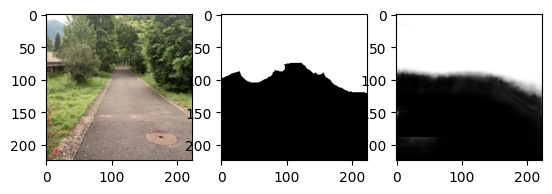

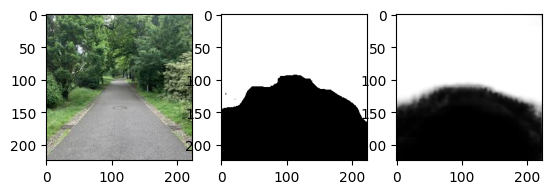

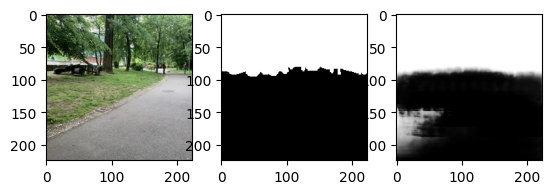

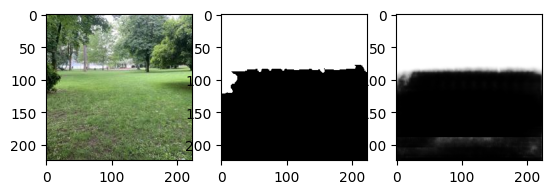

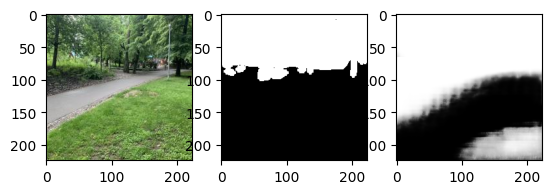

...

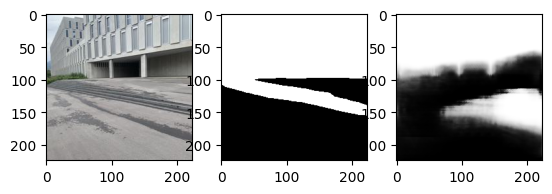

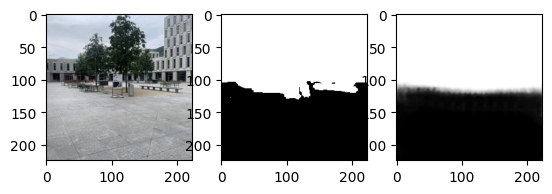

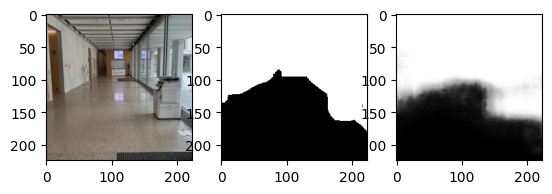

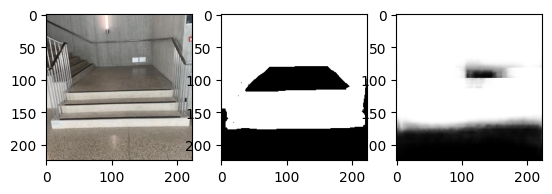

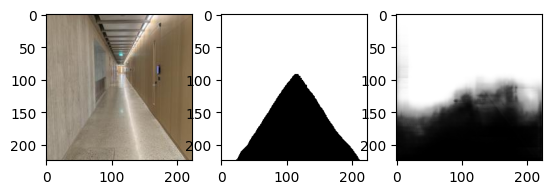

In [27]:
from matplotlib import pyplot as plt

for i in range(len(test_images)):
    fig, ax = plt.subplots(1, 3)
    ax[0].imshow(read_image(test_images[i]))
    ax[1].imshow(read_mask(test_masks[i]), cmap="gray")
    ax[2].imshow(y_pred_aug[i], cmap="gray")
    plt.show()

The masks do look more accurate than previous to the fine tuning, which means that the model did actually improve overall.